In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.ensemble import IsolationForest
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df =pd.read_csv("EastWestAirlines.csv")
df.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1


In [ ]:
df.dtypes

,0
ID#,int64
Balance,int64
Qual_miles,int64
cc1_miles,int64
cc2_miles,int64
cc3_miles,int64
Bonus_miles,int64
Bonus_trans,int64
Flight_miles_12mo,int64
Flight_trans_12,int64


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID#                3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [ ]:
df.isnull().sum()

,0
ID#,0
Balance,0
Qual_miles,0
cc1_miles,0
cc2_miles,0
cc3_miles,0
Bonus_miles,0
Bonus_trans,0
Flight_miles_12mo,0
Flight_trans_12,0


In [ ]:
df.duplicated().sum()

0

In [ ]:
df.describe()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3999.000000,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,2014.819455,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1160.764358,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,1.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1010.500000,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,2016.000000,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,3020.500000,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,4021.000000,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [3]:
# Remove outliers using Isolation Forest
iso_forest = IsolationForest(contamination=0.01, random_state=42)
outliers = iso_forest.fit_predict(df)
df_clean = df[outliers == 1]
# Scaling the features
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_clean), columns=df_clean.columns)

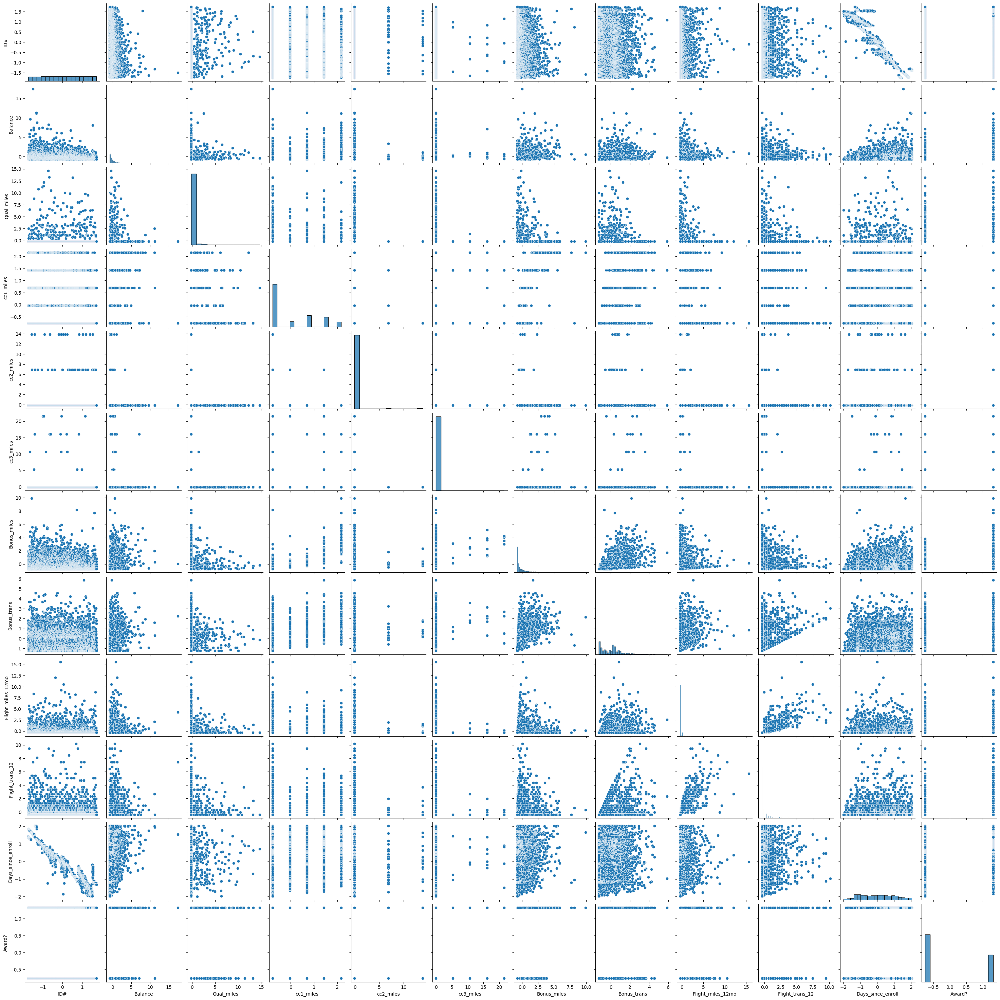

In [ ]:
#  Perform exploratory data analysis (EDA)
# Pairplot to visualize relationships
sns.pairplot(df_scaled)
plt.show()

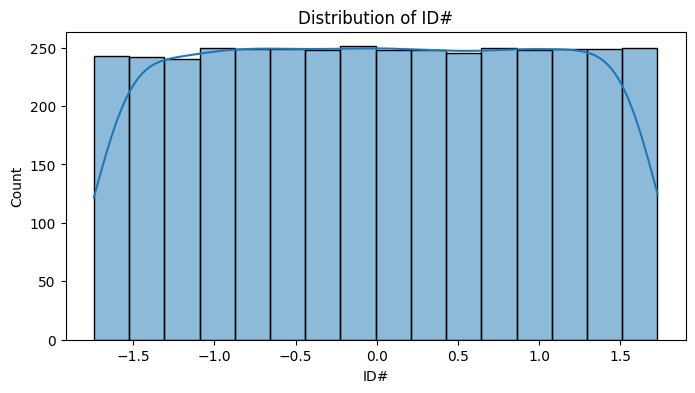

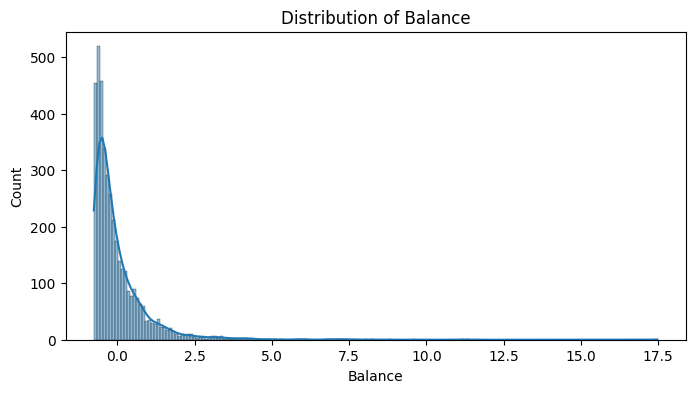

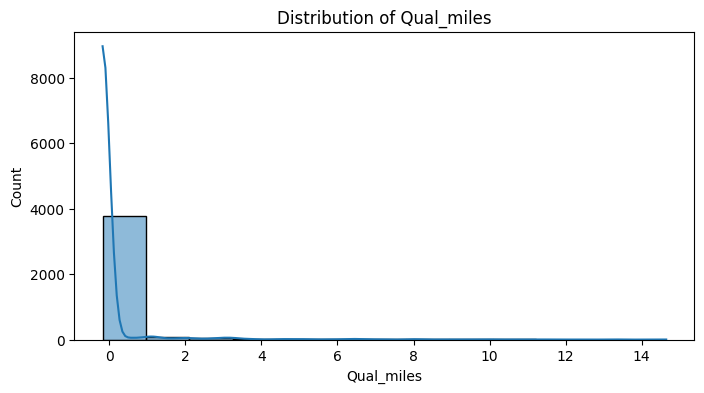

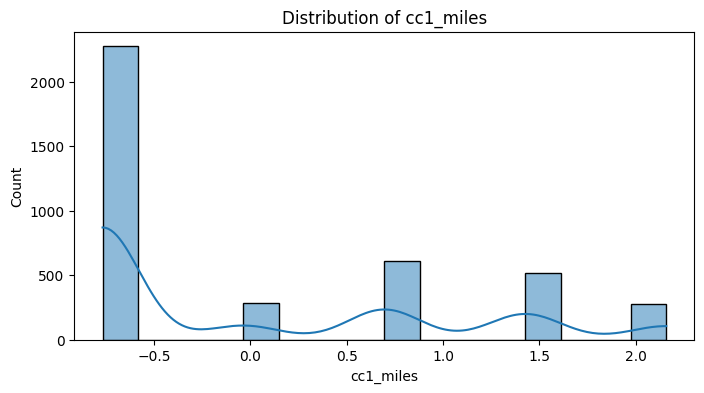

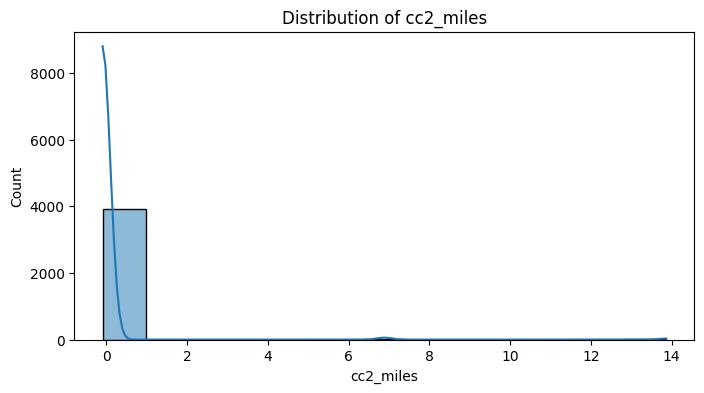

...

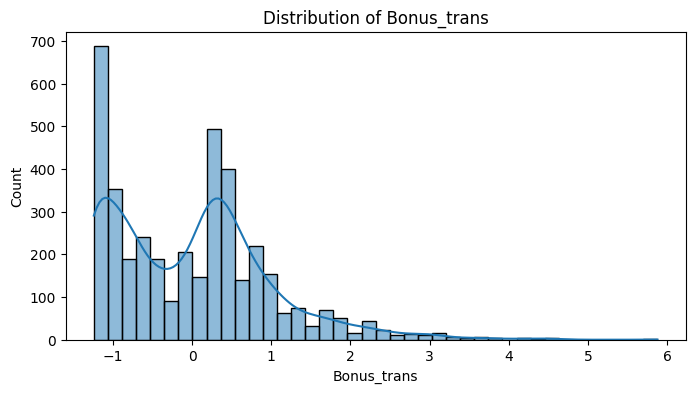

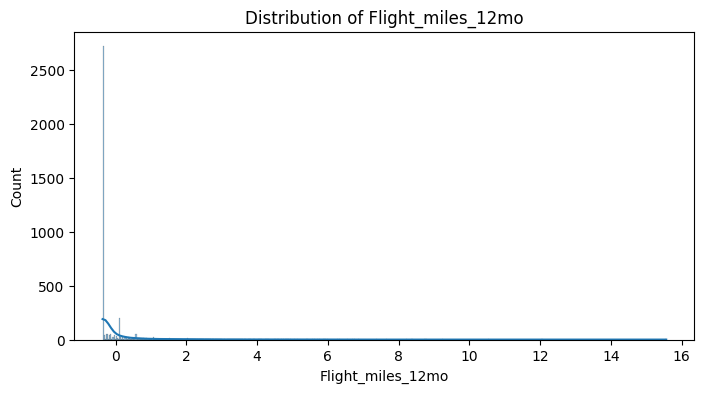

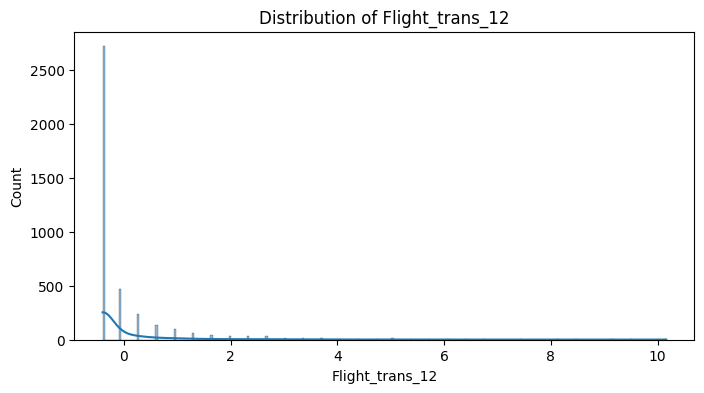

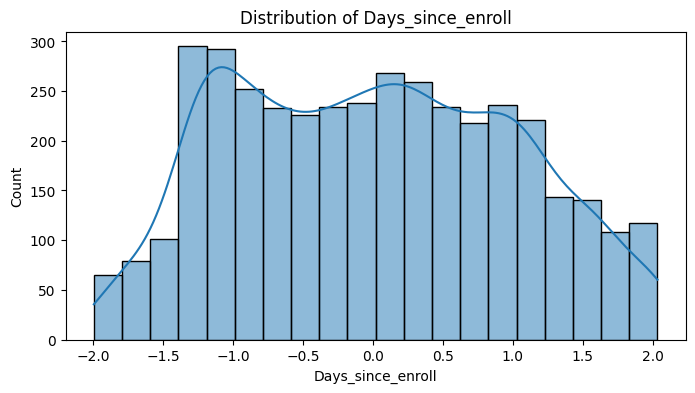

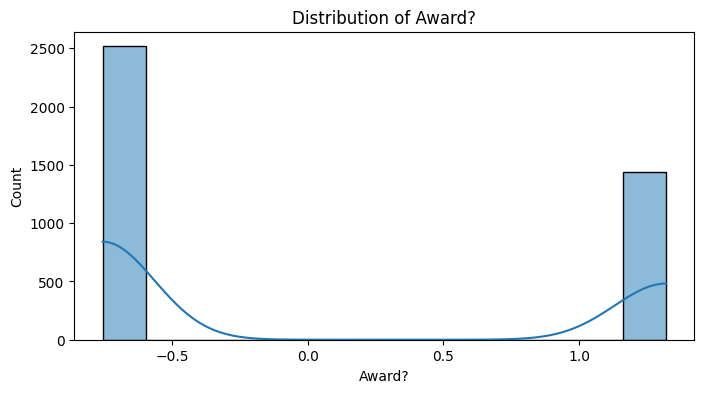

In [ ]:
# Distribution plots for each numerical feature
for col in df_scaled.columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_scaled[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

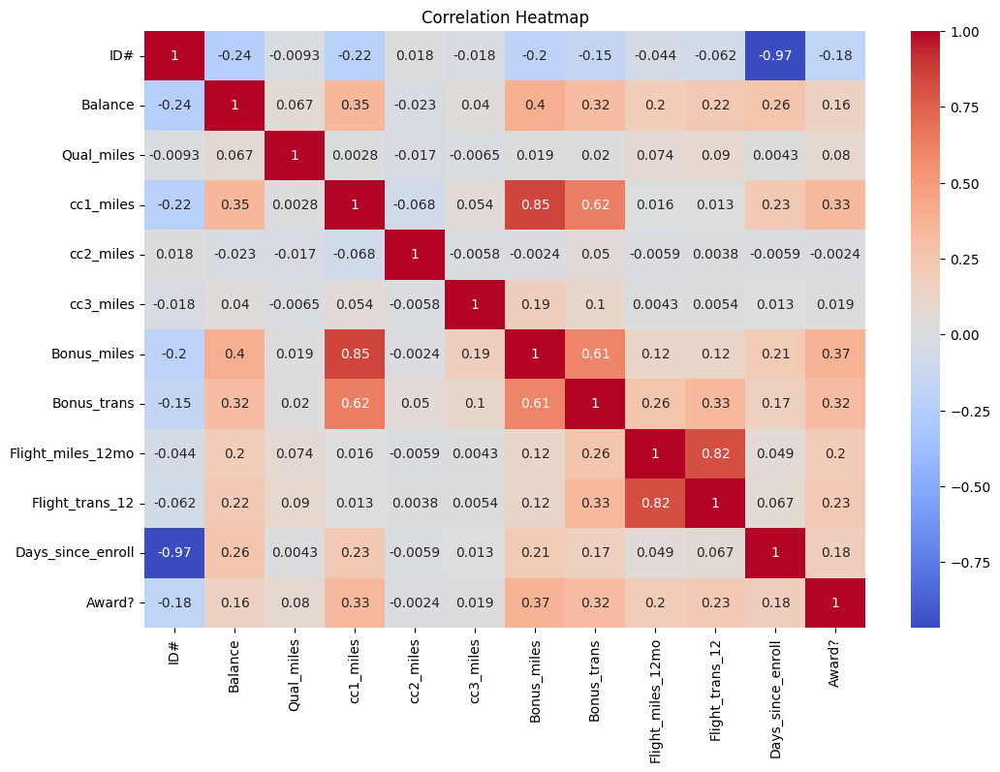

In [ ]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df_scaled.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

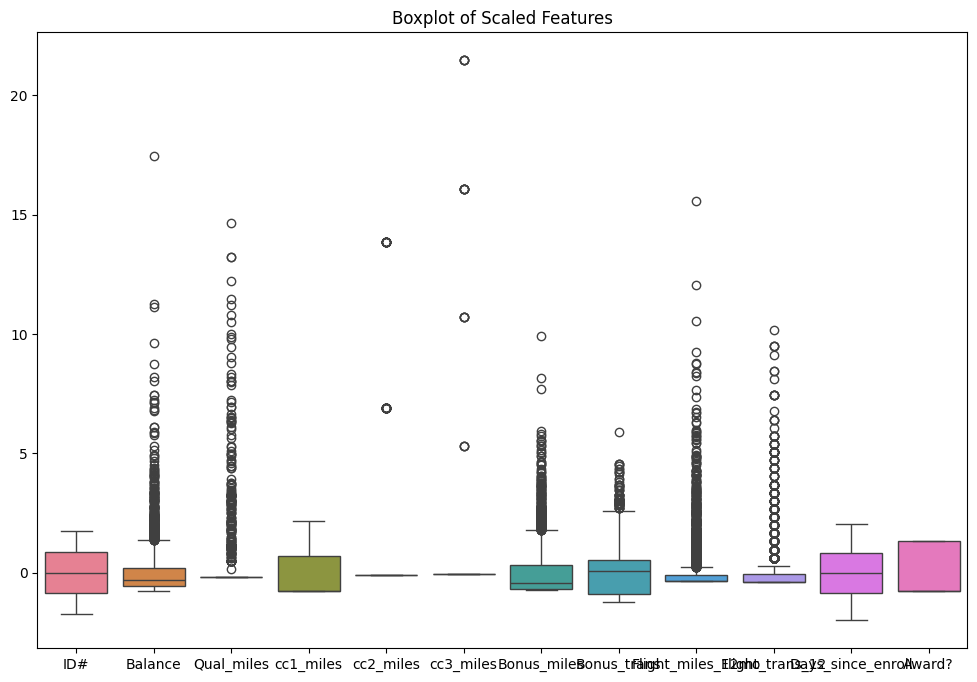

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_scaled)
plt.title('Boxplot of Scaled Features')
plt.show()

In [4]:
# Perform KMeans clustering
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=42)
df_scaled['Cluster'] = kmeans.fit_predict(df_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


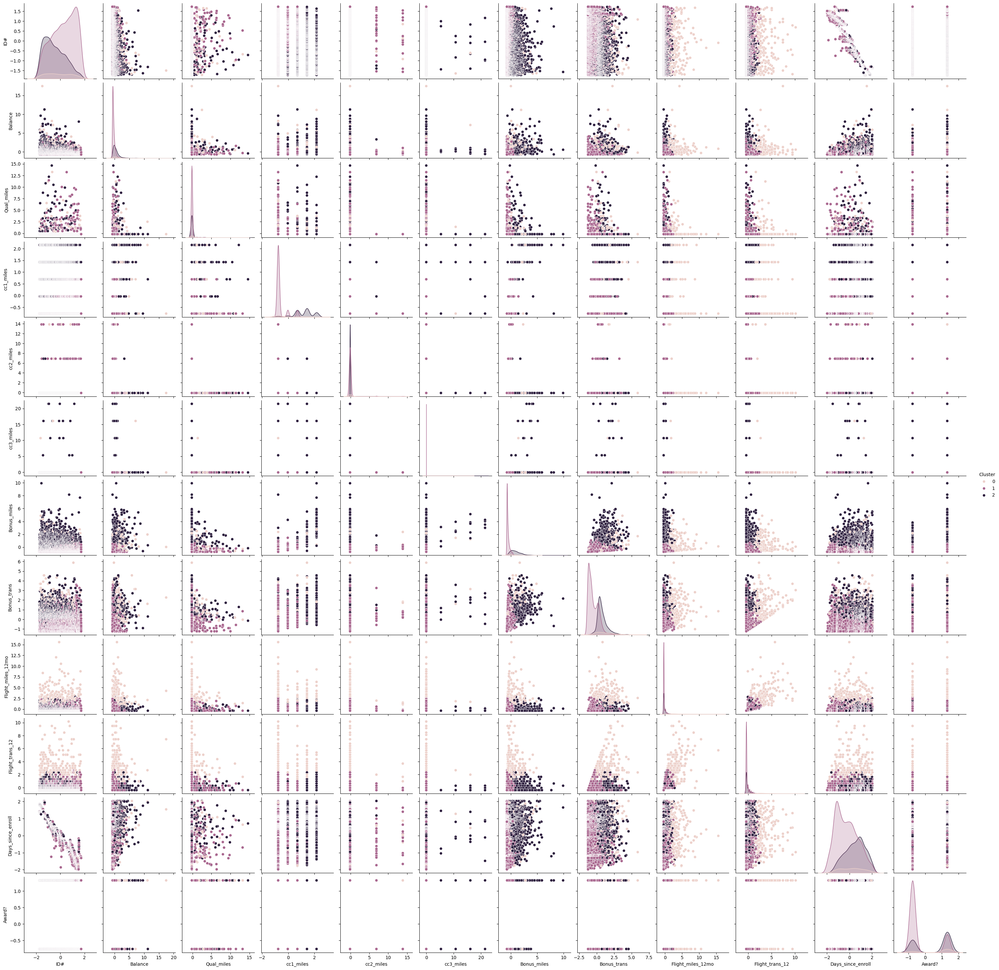

In [ ]:
# Visualize clusters
sns.pairplot(df_scaled, hue='Cluster')
plt.show()

In [5]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage

#  K-Means Clustering
# Determine the optimal number of clusters using the Elbow method
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    sse.append(kmeans.inertia_)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` ex

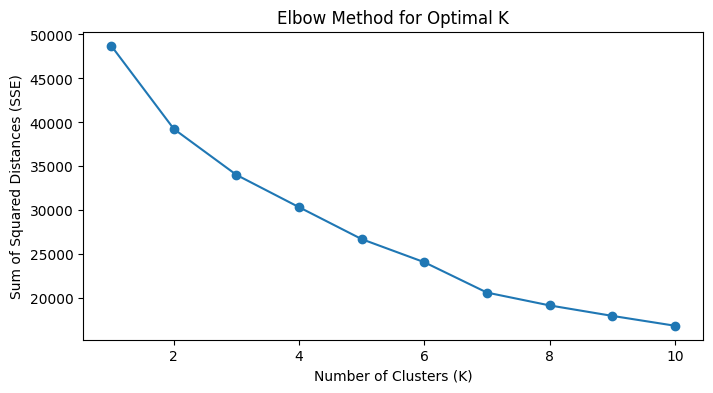

In [ ]:
# Plot the Elbow curve
plt.figure(figsize=(8, 4))
plt.plot(range(1, 11), sse, marker='o')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances (SSE)')
plt.title('Elbow Method for Optimal K')
plt.show()

In [6]:
# Fit K-Means with the chosen K (e.g., 3)
kmeans = KMeans(n_clusters=3, random_state=42)
df_scaled['KMeans_Cluster'] = kmeans.fit_predict(df_scaled)

# Silhouette score for K-Means
kmeans_silhouette = silhouette_score(df_scaled, df_scaled['KMeans_Cluster'])
print(f"K-Means Silhouette Score: {kmeans_silhouette:.3f}")

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


K-Means Silhouette Score: 0.321


In [7]:
# Fit K-Means with the chosen K (e.g., 7)
kmeans = KMeans(n_clusters=7, random_state=42)
df_scaled['KMeans_Cluster'] = kmeans.fit_predict(df_scaled)

# Silhouette score for K-Means
kmeans_silhouette = silhouette_score(df_scaled, df_scaled['KMeans_Cluster'])
print(f"K-Means Silhouette Score: {kmeans_silhouette:.3f}")

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


K-Means Silhouette Score: 0.288


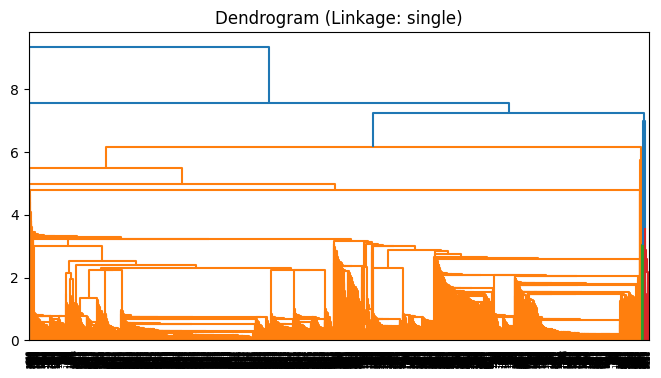

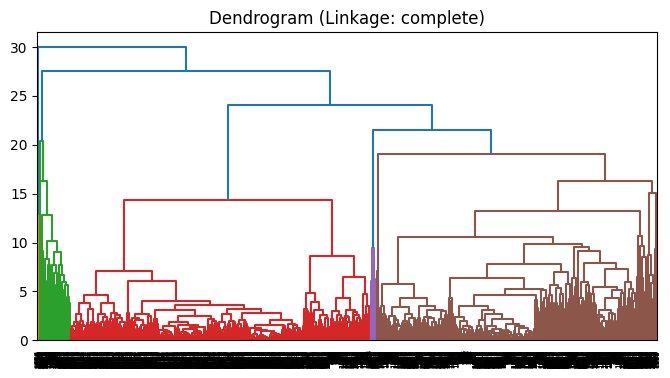

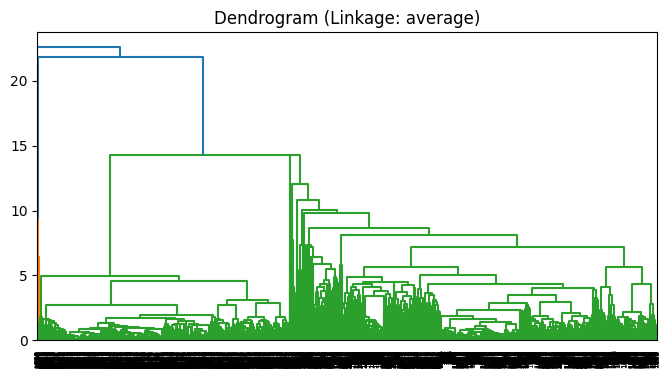

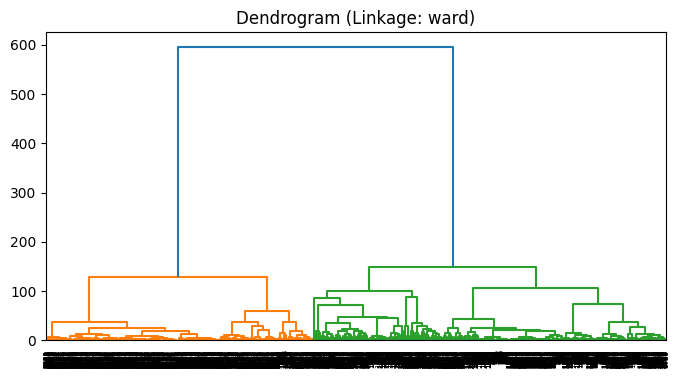

Hierarchical Clustering Silhouette Score: 0.481


In [13]:
#  Hierarchical Clustering
# Plot dendrograms for different linkage criteria
linkage_methods = ['single', 'complete', 'average', 'ward']

for method in linkage_methods:
    plt.figure(figsize=(8, 4))
    Z = linkage(df_scaled, method=method)
    dendrogram(Z)
    plt.title(f'Dendrogram (Linkage: {method})')
    plt.show()

# Fit Hierarchical clustering with a chosen method (e.g., 'ward')
hierarchical = AgglomerativeClustering(n_clusters=3, linkage='ward')
df_scaled['Hierarchical_Cluster'] = hierarchical.fit_predict(df_scaled)

# Silhouette score for Hierarchical Clustering
hierarchical_silhouette = silhouette_score(df_scaled, df_scaled['Hierarchical_Cluster'])
print(f"Hierarchical Clustering Silhouette Score: {hierarchical_silhouette:.3f}")

In [8]:
 #DBSCAN Clustering
# Experiment with different eps and min_samples values
eps_values = [0.5, 1.0, 1.5]
min_samples_values = [5, 10, 20]

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        df_scaled['DBSCAN_Cluster'] = dbscan.fit_predict(df_scaled)

        # Filter out noise points (-1 cluster) for silhouette score calculation
        if len(set(df_scaled['DBSCAN_Cluster'])) > 1:  # Ensure at least 2 clusters
            dbscan_silhouette = silhouette_score(df_scaled, df_scaled['DBSCAN_Cluster'])
            print(f"DBSCAN Silhouette Score (eps={eps}, min_samples={min_samples}): {dbscan_silhouette:.3f}")


DBSCAN Silhouette Score (eps=0.5, min_samples=5): 0.239
DBSCAN Silhouette Score (eps=0.5, min_samples=10): 0.152
DBSCAN Silhouette Score (eps=0.5, min_samples=20): 0.046
DBSCAN Silhouette Score (eps=1.0, min_samples=5): 0.333
DBSCAN Silhouette Score (eps=1.0, min_samples=10): 0.297
DBSCAN Silhouette Score (eps=1.0, min_samples=20): 0.305
DBSCAN Silhouette Score (eps=1.5, min_samples=5): 0.376
DBSCAN Silhouette Score (eps=1.5, min_samples=10): 0.367
DBSCAN Silhouette Score (eps=1.5, min_samples=20): 0.340


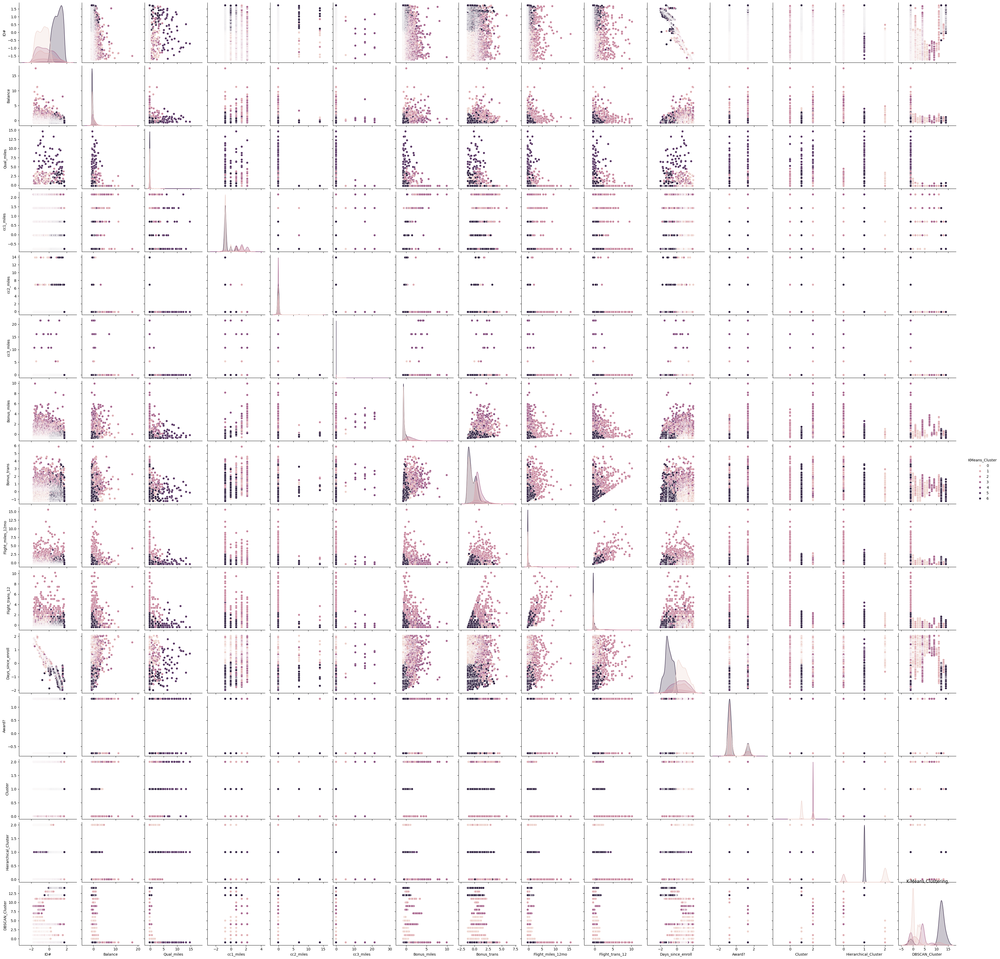

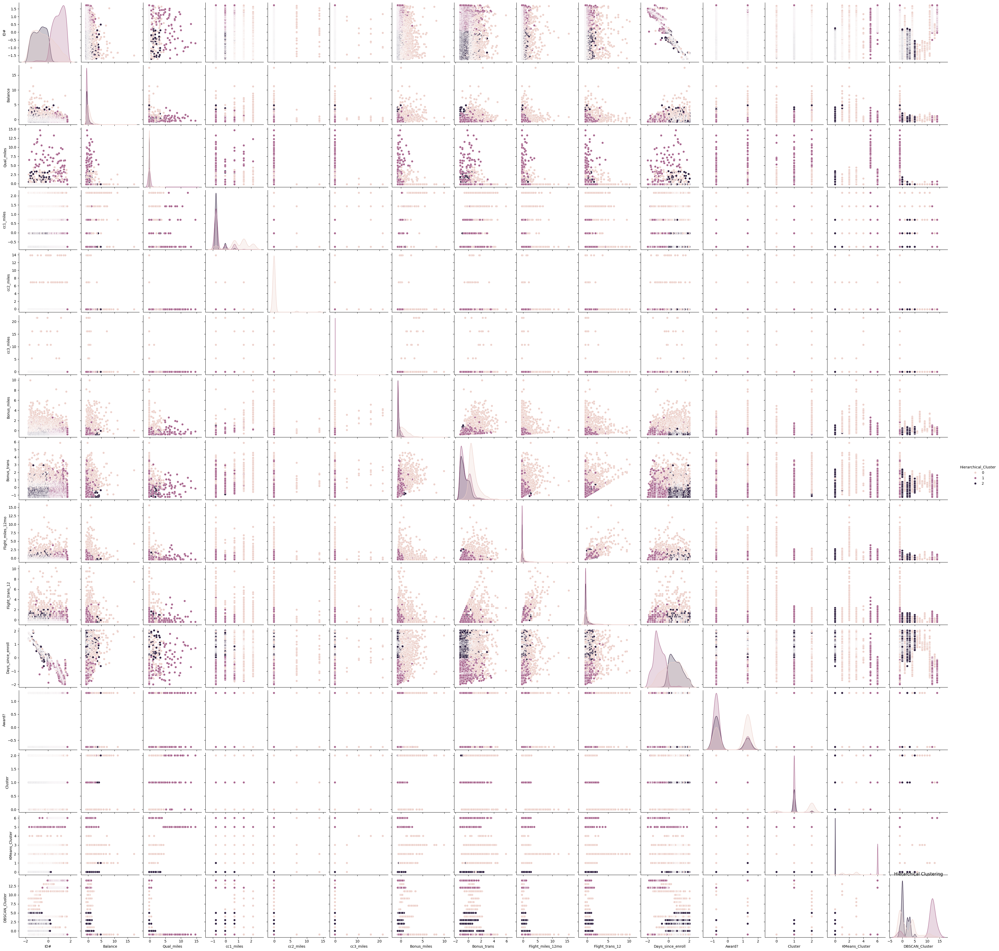

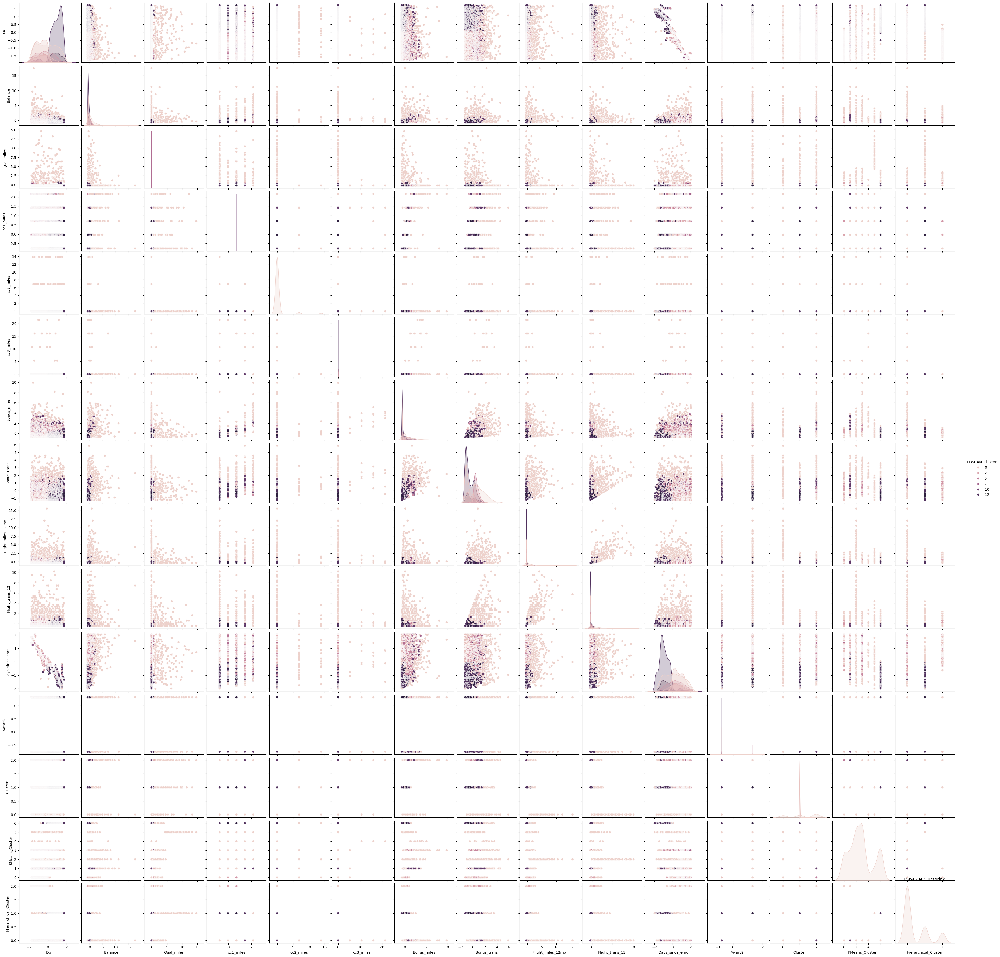

In [ ]:
# Visualize the final clusters for each algorithm
sns.pairplot(df_scaled, hue='KMeans_Cluster')
plt.title('K-Means Clustering')
plt.show()

sns.pairplot(df_scaled, hue='Hierarchical_Cluster')
plt.title('Hierarchical Clustering')
plt.show()

sns.pairplot(df_scaled, hue='DBSCAN_Cluster')
plt.title('DBSCAN Clustering')
plt.show()

In [9]:
# Analyze the characteristics of each cluster for K-Means
kmeans_clusters = df_scaled.groupby('KMeans_Cluster').mean()
print("K-Means Cluster Centers:\n", kmeans_clusters)

K-Means Cluster Centers:
                      ID#   Balance  Qual_miles  cc1_miles  cc2_miles  \
KMeans_Cluster                                                         
0              -0.758820 -0.227931   -0.067571  -0.633010  -0.095204   
1               1.001104 -0.391195   -0.019496  -0.672699  -0.095204   
2               0.493271  0.025270   -0.077293   0.918212  -0.095204   
3              -0.960753  0.779927    0.114781   1.370975  -0.095204   
4              -0.350040  0.738733   -0.064086   0.956517  -0.095204   
5              -0.127013  0.806391    0.367248  -0.052881  -0.095204   
6               0.215391 -0.225704   -0.176327  -0.693595   9.327573   

                cc3_miles  Bonus_miles  Bonus_trans  Flight_miles_12mo  \
KMeans_Cluster                                                           
0               -0.056413    -0.547430    -0.516632          -0.195242   
1               -0.061217    -0.574846    -0.606998          -0.239053   
2               -0.044722    

In [14]:
# Analyze the characteristics of each cluster for Hierarchical Clustering
hierarchical_clusters = df_scaled.groupby('Hierarchical_Cluster').mean()
print("\nHierarchical Clustering Cluster Centers:\n", hierarchical_clusters)


Hierarchical Clustering Cluster Centers:
                            ID#   Balance  Qual_miles  cc1_miles  cc2_miles  \
Hierarchical_Cluster                                                         
0                     0.716135 -0.251236   -0.173824  -0.053605  -0.095204   
1                    -0.664898 -0.165889   -0.040805  -0.331752  -0.095204   
2                    -0.334222  0.809339    0.431705   0.686540   0.362769   

                      cc3_miles  Bonus_miles  Bonus_trans  Flight_miles_12mo  \
Hierarchical_Cluster                                                           
0                     -0.061217    -0.156621    -0.228806          -0.273904   
1                     -0.061217    -0.303122    -0.341270          -0.171011   
2                      0.233264     0.850815     1.066854           0.865290   

                      Flight_trans_12  Days_since_enroll    Award?   Cluster  \
Hierarchical_Cluster                                                           
0    

In [15]:
# Analyze the characteristics of each cluster for DBSCAN
# Note: DBSCAN may have noise points labeled as -1, which should be excluded
dbscan_clusters = df_scaled[df_scaled['DBSCAN_Cluster'] != -1].groupby('DBSCAN_Cluster').mean()
print("\nDBSCAN Cluster Centers (excluding noise):\n", dbscan_clusters)


DBSCAN Cluster Centers (excluding noise):
                      ID#   Balance  Qual_miles  cc1_miles  cc2_miles  \
DBSCAN_Cluster                                                         
0              -0.798466 -0.402499   -0.158871  -0.738681  -0.095204   
1              -1.166972  0.451275   -0.176327   1.134060  -0.095204   
2              -0.664927 -0.377680   -0.165995  -0.736398  -0.095204   
3              -0.670628 -0.039553   -0.176327  -0.402989  -0.095204   
4              -0.971862  0.047652   -0.173147   1.408996  -0.095204   
5              -1.184617 -0.214695   -0.176327  -0.195559  -0.095204   
6              -0.983738  0.003841   -0.176327   0.660611  -0.095204   
7              -1.386215  0.776698   -0.176327   2.120994  -0.095204   
8              -0.963074 -0.435788   -0.176327   0.695423  -0.095204   
9              -1.296992  0.380843   -0.106358   1.349531  -0.095204   
10             -0.509791  1.143767   -0.176327   1.963592  -0.095204   
11              0.06

In [16]:
# Count the number of points in each cluster for each algorithm
kmeans_counts = df_scaled['KMeans_Cluster'].value_counts()
hierarchical_counts = df_scaled['Hierarchical_Cluster'].value_counts()
dbscan_counts = df_scaled['DBSCAN_Cluster'].value_counts()

print("\nK-Means Cluster Counts:\n", kmeans_counts)
print("\nHierarchical Clustering Cluster Counts:\n", hierarchical_counts)
print("\nDBSCAN Cluster Counts (including noise):\n", dbscan_counts)


K-Means Cluster Counts:
 KMeans_Cluster
1    1221
0    1121
3     698
2     653
5     212
6      40
4      14
Name: count, dtype: int64

Hierarchical Clustering Cluster Counts:
 Hierarchical_Cluster
0    1709
1    1427
2     823
Name: count, dtype: int64

DBSCAN Cluster Counts (including noise):
 DBSCAN_Cluster
 15    959
-1     885
 0     574
 4     209
 3     201
 12    198
 2     193
 16    146
 1     135
 11    114
 13    104
 14     55
 10     49
 5      32
 17     25
 6      21
 8      20
 7      20
 9      19
Name: count, dtype: int64


In [ ]:
''' The clusters formed by K-Means likely distinguish customers based on their flight activity and miles accumulated.
For instance, one cluster might group high-mileage, frequent flyers,
while another cluster could consist of less frequent travelers with lower mileage.
higher values in features like Bonus_miles and Qual_miles,
 indicates customers who participate more actively in bonus programs or are closer to achieving elite status.


In [ ]:
# Hierarchcial clustering identifies sub-segments within high-mileage customers,
#distinguishing between those who earn miles through flights versus those who accumulate miles through credit card bonuses.
# Different linkage methods (like ward or complete) may result in varying cluster shapes and sizes. For instance, ward linkage might create clusters with similar variance,
# while complete linkage could generate clusters that are more spread out.

In [ ]:
#DBSCAN is likely effective at identifying smaller, dense clusters of very active or highly loyal customers who might be outliers in other clustering methods.
#These clusters might include customers who frequently use rewards or those who are exceptionally engaged with the airline's bonus programs.
#The noise points (customers classified as -1) represent outliers—customers who do not fit neatly into any cluster. These could be infrequent flyers or those with highly unusual behavior patterns.

In [ ]:
#The airline could use these clusters to design more personalized marketing campaigns, optimize loyalty programs,
#and identify key customer segments for targeted rewards or special offers. For example, high-value clusters identified by K-Means could receive exclusive offers,
 #while DBSCAN’s noise points might represent customers who need more personalized engagement strategies.

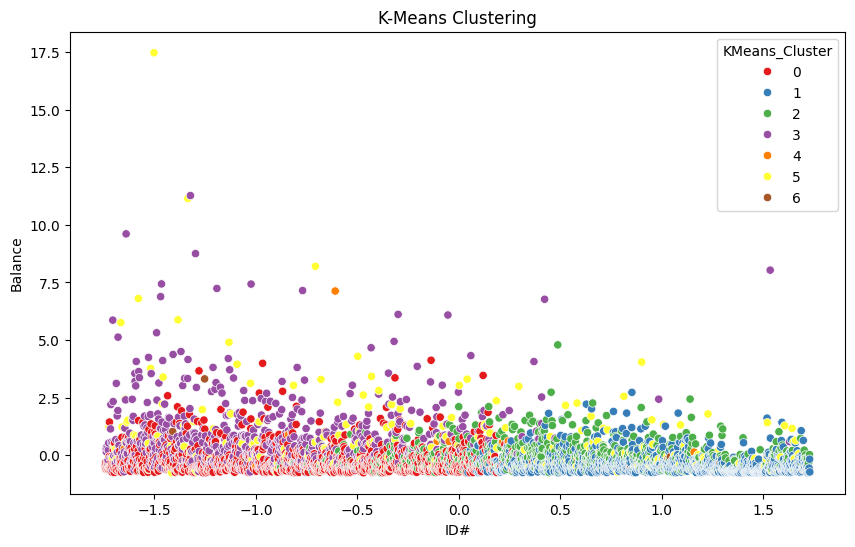

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize K-Means Clustering Results
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_scaled, x=df_scaled.iloc[:, 0], y=df_scaled.iloc[:, 1], hue='KMeans_Cluster', palette='Set1')
plt.title('K-Means Clustering')
plt.show()

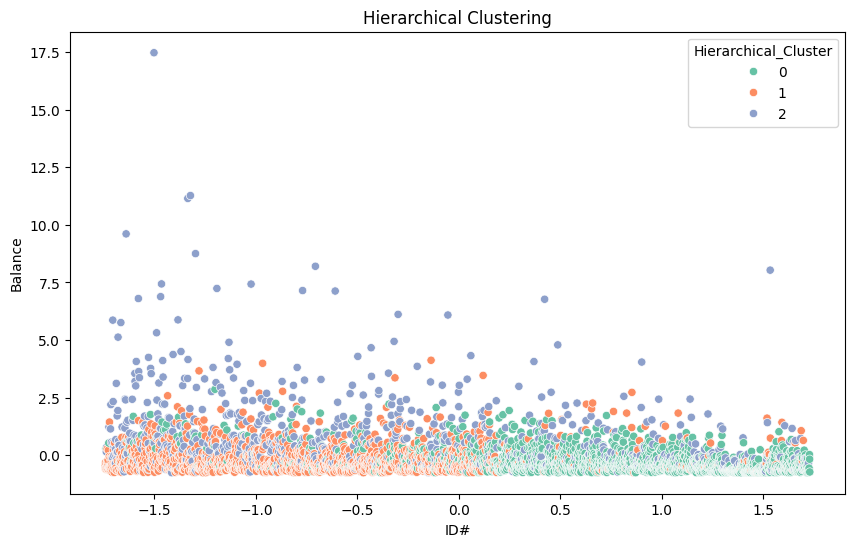

In [18]:
# Visualize Hierarchical Clustering Results
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_scaled, x=df_scaled.iloc[:, 0], y=df_scaled.iloc[:, 1], hue='Hierarchical_Cluster', palette='Set2')
plt.title('Hierarchical Clustering')
plt.show()

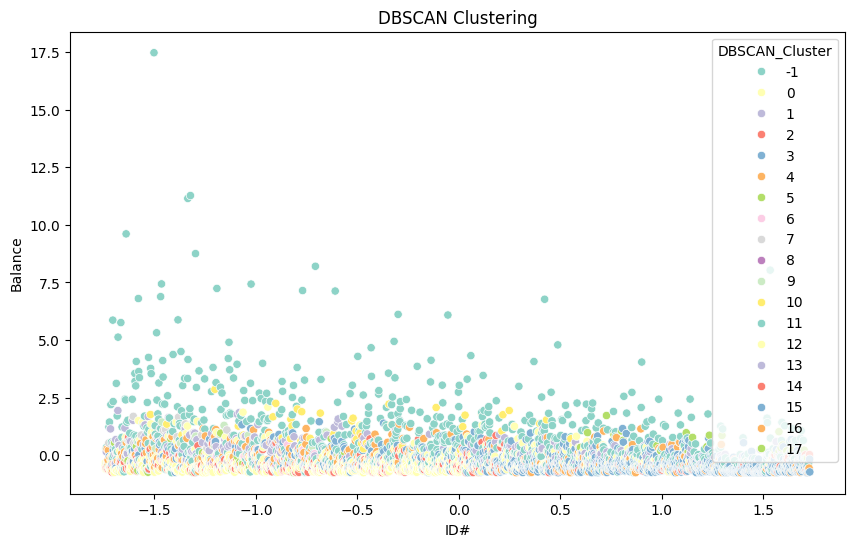

In [19]:
# Visualize DBSCAN Clustering Results
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_scaled, x=df_scaled.iloc[:, 0], y=df_scaled.iloc[:, 1], hue='DBSCAN_Cluster', palette='Set3')
plt.title('DBSCAN Clustering')
plt.show()

In [ ]:
# The Silhouette Score ranges from -1 to 1, where a higher score indicates better-defined clusters

In [20]:
from sklearn.metrics import silhouette_score

# Evaluate K-Means Clustering
kmeans_silhouette = silhouette_score(df_scaled, df_scaled['KMeans_Cluster'])
print(f"K-Means Silhouette Score: {kmeans_silhouette:.3f}")

# Evaluate DBSCAN Clustering (excluding noise points labeled as -1)
dbscan_silhouette = silhouette_score(df_scaled[df_scaled['DBSCAN_Cluster'] != -1], df_scaled[df_scaled['DBSCAN_Cluster'] != -1]['DBSCAN_Cluster'])
print(f"DBSCAN Silhouette Score (excluding noise): {dbscan_silhouette:.3f}")



K-Means Silhouette Score: 0.316
DBSCAN Silhouette Score (excluding noise): 0.502
